In [1]:
from typing import Literal
import torch.optim as optim
import torch.nn as nn
from tqdm.notebook import tqdm
from torchvision.transforms import v2
from torchvision.io import read_image
import torch
import matplotlib.pyplot as plt
from helpers import plot
from skimage.metrics import peak_signal_noise_ratio
from diffusers import UNet2DModel
from torchinfo import summary
from deep_image_prior.models import get_net
import numpy as np

/home/yungen/jupyter/.venv/lib/python3.10/site-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)


In [2]:
img_size = (512, 512)
# img_size = (256, 256)
transforms = v2.Compose(
    [
        v2.Resize(img_size),
        v2.ToDtype(torch.float32, scale=True),
        # v2.Normalize(mean=[0.5], std=[0.5]),
    ]
)
img = read_image("data/F16_GT.png")
img = transforms(img)

In [3]:
from deep_image_prior.utils.common_utils import (
    crop_image,
    pil_to_np,
    plot_image_grid,
    get_image,
    get_noise,
    torch_to_np,
    np_to_torch,
    get_params,
    optimize,
)


def sigmoid_beta_schedule(timesteps, start=-3, end=3, tau=1, clamp_min=1e-5):
    """
    sigmoid schedule
    proposed in https://arxiv.org/abs/2212.11972 - Figure 8
    better for images > 64x64, when used during training
    """
    steps = timesteps + 1
    t = torch.linspace(0, timesteps, steps, dtype=torch.float64) / timesteps
    v_start = torch.tensor(start / tau).sigmoid()
    v_end = torch.tensor(end / tau).sigmoid()
    alphas_cumprod = (-((t * (end - start) + start) / tau).sigmoid() + v_end) / (
        v_end - v_start
    )
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0, 0.999)


def extract(a, t, x_shape):
    b, *_ = t.shape
    out = a.gather(-1, t)
    result = out.reshape(b, *((1,) * (len(x_shape) - 1)))
    return result


def exists(x):
    return x is not None


def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d


def q_sample(
    x_start, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, noise=None
):
    noise = default(noise, lambda: torch.randn_like(x_start))

    return (
        extract(sqrt_alphas_cumprod, t, x_start.shape) * x_start
        + extract(sqrt_one_minus_alphas_cumprod, t, x_start.shape) * noise
    )


timesteps = 10
betas = sigmoid_beta_schedule(timesteps)
alphas = 1.0 - betas
alphas_cumprod = torch.cumprod(alphas, dim=0)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - alphas_cumprod)


def add_step_noise(img, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    noise = torch.randn_like(img)
    step_img_torch = [img]
    for t in range(timesteps):
        result = (
            extract(sqrt_alphas_cumprod, torch.LongTensor([t]), img.shape) * img
            + extract(sqrt_one_minus_alphas_cumprod, torch.LongTensor([t]), img.shape)
            * noise
        ).to(img.dtype)
        step_img_torch.append(result)
    return step_img_torch

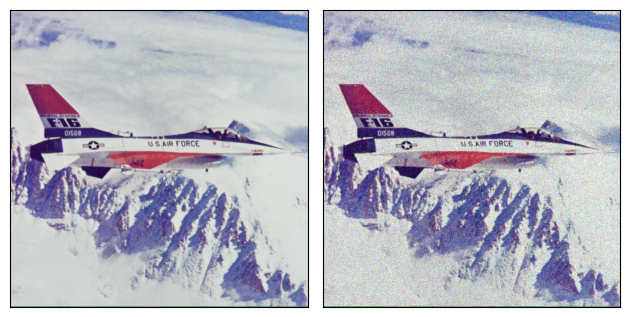

In [4]:
def get_noisy_image(img, sigma):
    # return torch.clamp(img + torch.normal(0.0, sigma, size=img.shape), -1, 1)
    return torch.clip(img + torch.normal(0.0, sigma, size=img.shape), 0, 1).detach()
    # return img + torch.normal(0.0, sigma, size=img.shape)

sigma = 25
sigma_ = sigma/255.
noisy = get_noisy_image(img,sigma_)
# plot([unnormalize(img), unnormalize(noisy)])
# plot([(img * 0.5) + 0.5, (noisy*0.5) + 0.5])
plot([img, noisy])

/home/yungen/jupyter/.venv/lib/python3.10/site-packages/skimage/metrics/simple_metrics.py:167: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.086933..4.9602356].


torch.Size([1, 3, 512, 512])


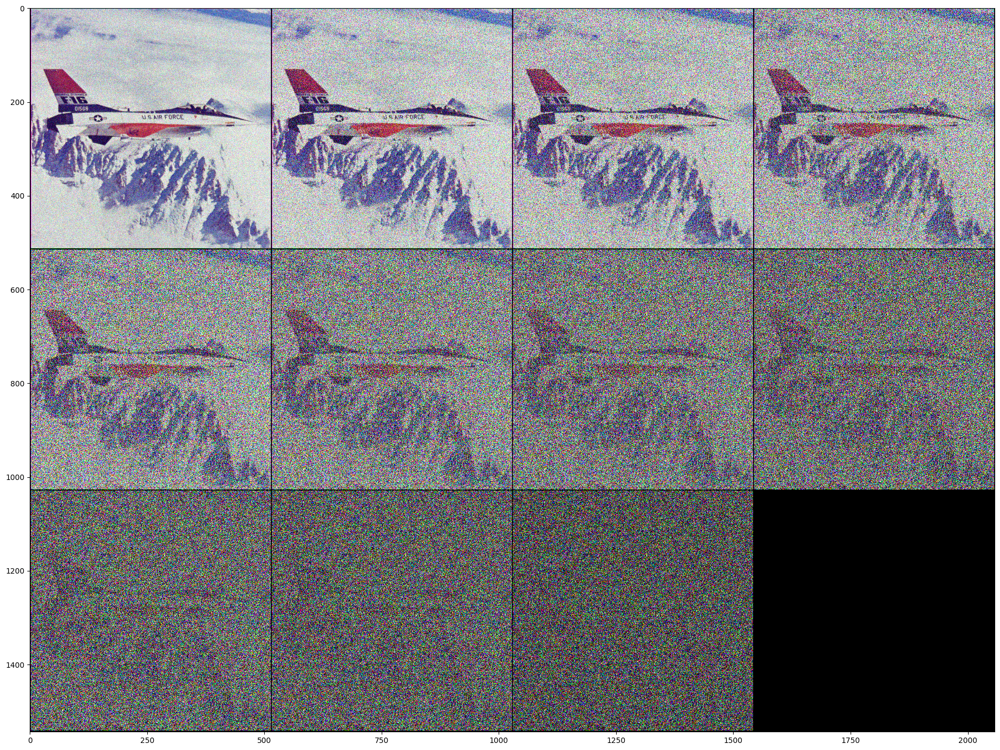

In [5]:
img_input = noisy.clone().detach().unsqueeze(0)
print(img_input.shape)
img_input_steps = add_step_noise(img_input, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
# plot([t.squeeze(0) for t in img_input_steps])
img_input_steps_np = [torch_to_np(s) for s in img_input_steps]
# for i in img_input_steps_np:
    # print(peak_signal_noise_ratio(torch_to_np(img_input), i))
psnr_gt = [peak_signal_noise_ratio(torch_to_np(img_input), i) for i in img_input_steps_np]
plot_image_grid([torch_to_np(s) for s in img_input_steps], 4, 12)

img_input_steps.reverse()
psnr_gt.reverse()


In [6]:
def generate_noise(noise_type: Literal["normal"] | Literal["uniform"], shape: tuple[int]):
    if noise_type == "normal":
        return torch.randn(shape)
    elif noise_type == "uniform":
        return torch.FloatTensor(*shape).uniform_(0, 1) * 1./10 # dip paper use 0 ~ 0.1 with input range 0 ~ 1
    else:
        raise ValueError("Invalid noise type")

In [7]:
input_depth = 32
pad = "reflection"
net = get_net(
    input_depth,
    "skip",
    pad,
    skip_n33d=128,
    skip_n33u=128,
    skip_n11=4,
    num_scales=5,
    upsample_mode="bilinear",
)

modify_net = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=input_depth, kernel_size=3, padding=(1, 1)), net)
# net_input = generate_noise("uniform", (1, input_depth, *img_size)).to("cuda").detach()
print(summary(modify_net, input_data=img_input_steps[0]))
modify_net = modify_net.to("cuda")

Layer (type:depth-idx)                                                                                         Output Shape              Param #
Sequential                                                                                                     [1, 3, 512, 512]          --
├─Conv2d: 1-1                                                                                                  [1, 32, 512, 512]         896
├─Sequential: 1-2                                                                                              [1, 3, 512, 512]          --
│    └─Concat: 2-1                                                                                             [1, 132, 512, 512]        --
│    │    └─Sequential: 3-1                                                                                    [1, 4, 512, 512]          140
│    │    └─Sequential: 3-2                                                                                    [1, 128, 512, 512]        2,047,824
│    └

In [8]:
mse = nn.MSELoss()
# lr = 2e-4
lr = 0.01

optimizer = optim.Adam(net.parameters(), lr=lr)
reg_noise_std = 1.0 / 30.0
exp_weight = 0.99

In [9]:
def custom_schedule(start_length, length, steps):
    sequence = []
    current_value = 0
    # l = start_length // steps // 2
    l = 10
    for i in range(start_length):
        if i % l == 0:
            current_value += 1
        sequence.append(current_value)
    sequence = np.array(sequence)
    sequence = np.clip(sequence, 0, steps)
    return np.concatenate([sequence, np.array([steps] * (length - start_length))])

def sigmoid_sequence(start_length, length, steps ,k=20):
    # Generate values from -k to k
    x = np.linspace(-k, k, num=start_length)
    # Apply sigmoid transformation
    sequence = 1 / (1 + np.exp(-x))
    # Scale to the desired length
    sequence = sequence * (steps - 1) + 1
    # Convert to integers
    sequence = np.round(sequence).astype(int)
    # Ensure sequence is strictly increasing
    sequence = np.maximum.accumulate(sequence)
    # Repeat the last value to reach the desired length
    return np.concatenate([sequence, np.array([steps] * (length - start_length))])

def step_schedular(start_length ,length, steps, schedular_type: str):
    if schedular_type == "custom":
        return custom_schedule(start_length,length,steps)
    elif schedular_type == "sigmoid":
        return sigmoid_sequence(start_length, length, steps, 20)
    else:
        raise ValueError("Invalid schedular type")

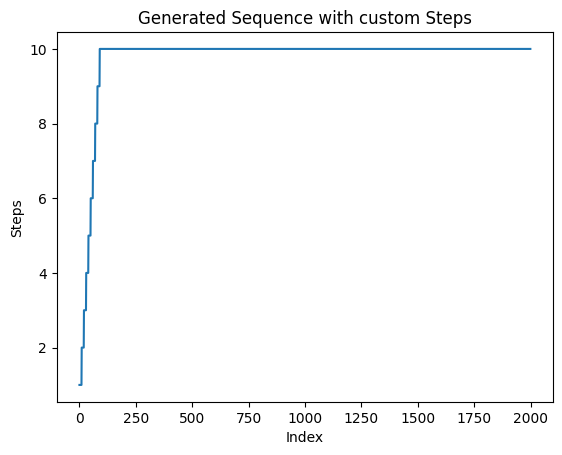

In [10]:
# schedular_type = "sigmoid"
schedular_type = "custom"
sequence = step_schedular(200, 2000, timesteps, schedular_type)
plt.plot(sequence)
plt.title(f'Generated Sequence with {schedular_type} Steps')
plt.xlabel('Index')
plt.ylabel('Steps')
plt.show()

  0%|          | 0/2000 [00:00<?, ?it/s]

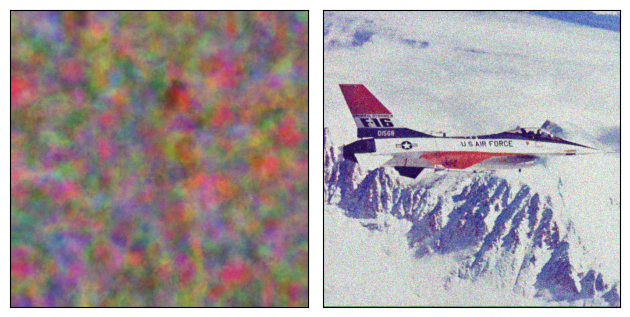

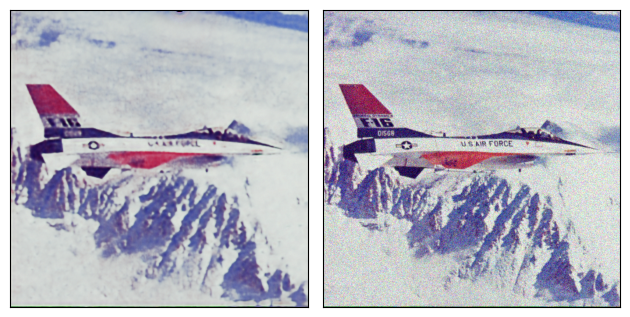

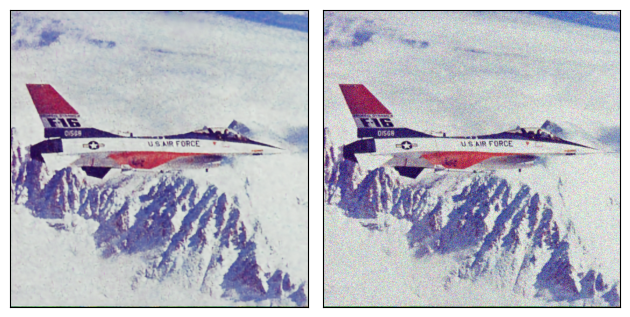

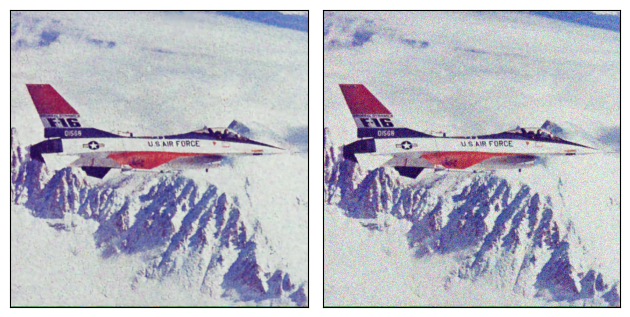

In [11]:
img_noisy_np = noisy.clone().detach().cpu().numpy()
img_np = img.clone().detach().cpu().numpy()


# img_noisy_torch = noisy.clone().detach().to("cuda")
# net_input_saved = net_input.detach().clone()
# noise = net_input.detach().clone()
# img_input_steps

net_input = img_input_steps[0].clone().detach().to("cuda")
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

img_input_steps = [i.to("cuda") for i in img_input_steps]

out_avg = None
psrn_history = []
psrn_gt_history = []
psrn_gt_sm_history = []
# step = 1
for i in (pbar := tqdm(range(2000))):
    optimizer.zero_grad()
    net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = modify_net(net_input)
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)

    step = sequence[i]
    loss = mse(out, img_input_steps[step])
    loss.backward()
    optimizer.step()
    if i % 10 == 0:
        # if step != len(img_input_steps) - 1:
            # step += 1
        psrn = peak_signal_noise_ratio(img_noisy_np, out.detach().cpu().numpy()[0]) 
        psrn_gt = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0]) 
        psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0]) 
        psrn_history.append(psrn)
        psrn_gt_history.append(psrn_gt)
        psrn_gt_sm_history.append(psrn_gt_sm)
        pbar.set_postfix({"Loss": round(loss.item(), 6), "PSNR": round(psrn, 2), "PSNR_GT": round(psrn_gt, 2), "PSNR_GT_SM": round(psrn_gt_sm, 2)})
    if i % 500 == 0:
        plot([out.squeeze(0), noisy.squeeze(0)])

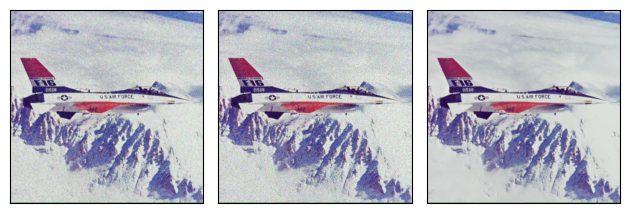

In [12]:
out = modify_net(net_input)
plot([out.squeeze(0), noisy.squeeze(0), img])

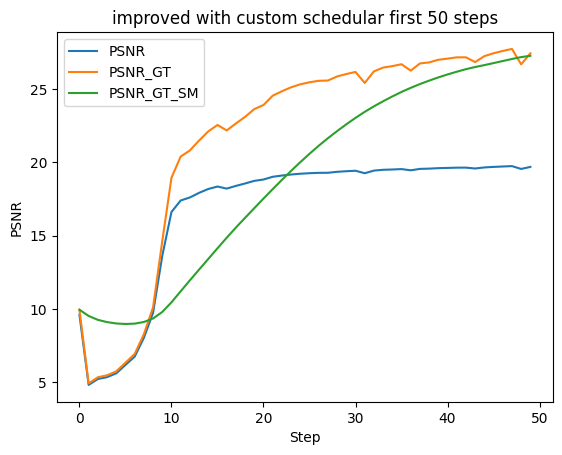

In [13]:
plt.plot(psrn_history[:50], label="PSNR")
plt.plot(psrn_gt_history[:50], label="PSNR_GT")
plt.plot(psrn_gt_sm_history[:50], label="PSNR_GT_SM")
plt.xlabel("Step")
plt.ylabel("PSNR")
plt.title(f"improved with {schedular_type} schedular first 50 steps")
plt.legend()

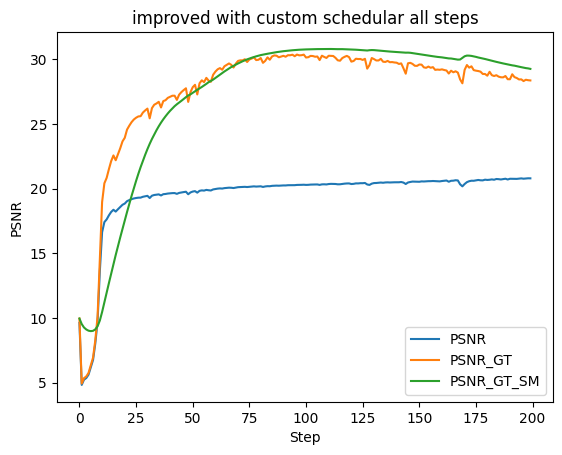

In [14]:
plt.plot(psrn_history, label="PSNR")
plt.plot(psrn_gt_history, label="PSNR_GT")
plt.plot(psrn_gt_sm_history, label="PSNR_GT_SM")
plt.xlabel("Step")
plt.ylabel("PSNR")
plt.title(f"improved with {schedular_type} schedular all steps")
plt.legend()

In [15]:
out_psrn_history = np.array(psrn_history)
out_psrn_gt_history = np.array(psrn_gt_history)
out_psrn_gt_sm_history = np.array(psrn_gt_sm_history)

np.save(f"results/{schedular_type}_psnr_history.npy", out_psrn_history)
np.save(f"results/{schedular_type}_psnr_gt_history.npy", out_psrn_gt_history)
np.save(f"results/{schedular_type}_psnr_gt_sm_history.npy", out_psrn_gt_sm_history)

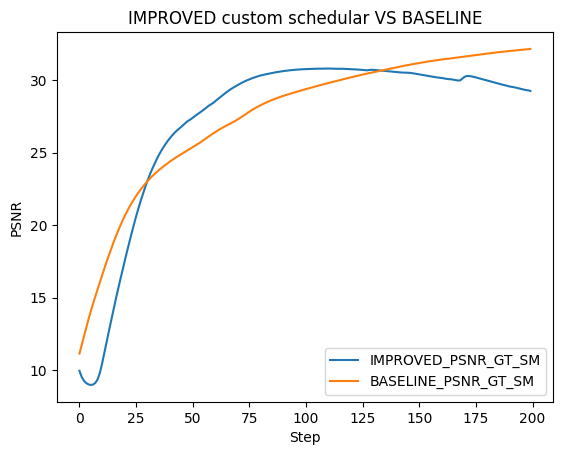

In [17]:
baseline_psrn_history = np.load("results/psnr_history.npy")
baseline_psrn_gt_history = np.load("results/psnr_gt_history.npy")
baseline_psrn_gt_sm_history = np.load("results/psnr_gt_sm_history.npy")

# plt.plot(out_psrn_history, label="IMPROVED_PSNR")
plt.plot(out_psrn_gt_sm_history, label="IMPROVED_PSNR_GT_SM")

# plt.plot(baseline_psrn_history, label="BASELINE_PSNR")
plt.plot(baseline_psrn_gt_sm_history, label="BASELINE_PSNR_GT_SM")
plt.xlabel("Step")
plt.ylabel("PSNR")
plt.title(f"IMPROVED {schedular_type} schedular VS BASELINE")
plt.legend()

In [ ]:
baseline_psrn_history = np.load("results/sigmoid_psnr_history.npy")
baseline_psrn_gt_history = np.load("results/sigmoid_psnr_gt_history.npy")
baseline_psrn_gt_sm_history = np.load("results/sigmoid_psnr_gt_sm_history.npy")

# plt.plot(out_psrn_history, label="IMPROVED_PSNR")
plt.plot(out_psrn_gt_sm_history, label="IMPROVED_PSNR_GT_SM")

# plt.plot(baseline_psrn_history, label="BASELINE_PSNR")
plt.plot(baseline_psrn_gt_sm_history, label="BASELINE_PSNR_GT_SM")
plt.xlabel("Step")
plt.ylabel("PSNR")
plt.title(f"IMPROVED {schedular_type} schedular VS BASELINE")
plt.legend()